FinCEN文章を解析する（データ編）

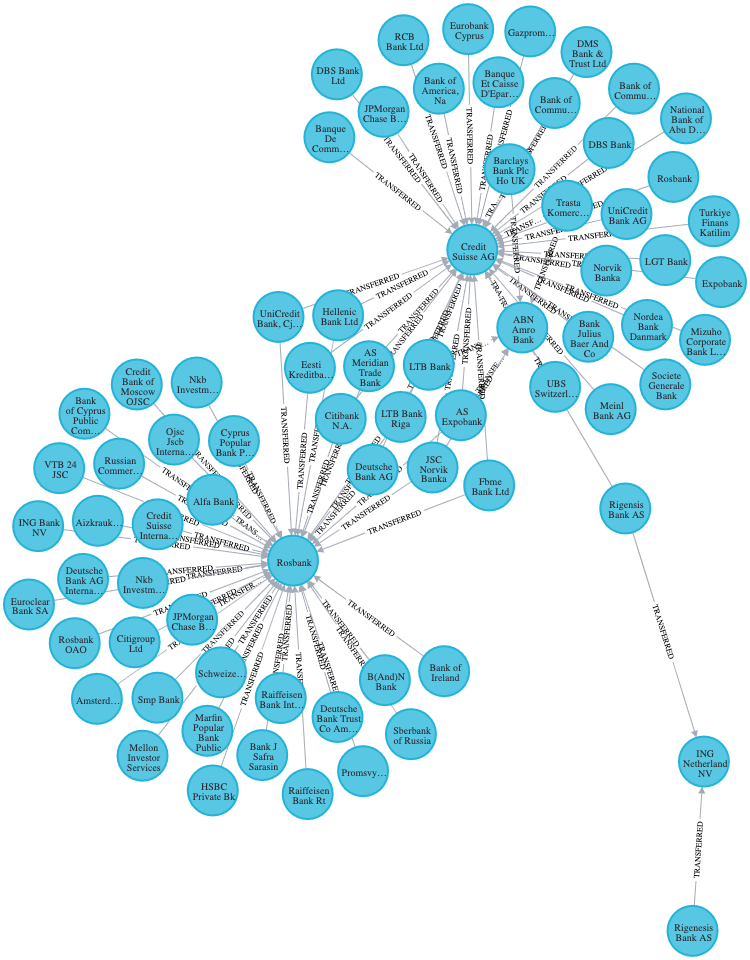

# FinCEN文章とは

アメリカで事業を展開する金融機関がマネロンダリングなどの疑いのある取引についてアメリカ政府に報告する義務があるようです。
報告したからといってまだ疑わしいというだけで取引そのものが違法とは限りません。
しかし疑わしい取引である場合、金融機関がこれを精査して止めることもできるが、報告だけ出してそのまま処理することもできる、そして後者の方が手数料を得ることができるため、金融機関がほとんどの場合に後者を選択し、マネーロンダリングを放置していたのではないか、という嫌疑がかけられています。

# データについて

データの調査分析を行ったのはICIJ（International Consortium of Investigative Journalists）という機関で、詳細は下記の記事を参照してください。

https://www.icij.org/investigations/fincen-files/mining-sars-data/

多岐にわたるつながり情報を一つにまとめるためにデータの分析と可視化にはグラフデータベースのNeo4jが使われたそうです。
CSV形式のデータはこちらから入手することができます。

https://www.icij.org/investigations/fincen-files/download-fincen-files-transaction-data/

データの項目が多岐にわたるが、Neo4jコニュニティの方によってわかりやすく処理し、さらに簡単に分析するクリプトが共有されましたので、こちらを使います。

- ソースコードとデータ：https://github.com/jexp/fincen
- 解説記事：https://neo4j.com/blog/analyzing-fincen-files-data-neo4j/
- 解説動画：https://www.youtube.com/watch?v=NIzx3kVUAJk

# 環境

Neo4jの環境は無料で簡単に用意できます。
以下の２つがおすすめです。

- Neo4j Sandboxに提供されているFinCENデータが予め読み込んであるサーバを使う。機能が一部に限定されるが、ブラウザさえあればできるので手軽です。
- ローカルにNeo4j Desktopをインストールしてデータを読み込む

Sandboxはこちらです（アカウント登録すれば無料で使えます）。
- https://sandbox.neo4j.com/?usecase=fincen

Neo4j Desktopはこちらからダウンロードできます。
- https://neo4j.com/download/

# データ読み込み

sandboxの場合はデータが予め入っています。

Desktopの場合はNeo4j Browserからこちらのコマンドをコピペすればいいです（スクレイピングデータ版と公式提供版のデータに対応するスクリプトがそれぞれ用意されていますが、こちらではスクレイピング版を使います。公式のcsvファイルには入っていない地理情報があります）。

https://github.com/jexp/fincen/blob/main/fincen.cypher

# データ説明

ノードはFiling、EntityとCountryからなっています。

- Filing: 疑わしい取引についての報告、金額がamount属性に格納されています
- Entity: 金融機関
- Country: 金融機関支店所在地

関係としては

- FILED: 報告（Filing）を提出した金融機関（Entity）を指す
- ORIGINATOR: 送金の起点金融機関
- BENEFITS: 送金先の金融機関
- CONCERNS: 取次をしたり、取引に関係した金融機関
- COUNTRY: 金融機関の所在地を示すリンク

次のようなイメージになります。

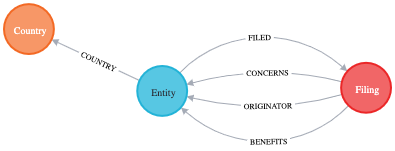

# Cypher QueryでEDAしてみる

## 金額の大きい怪しい取引をざっとみる

とりあえず金額の大きい報告の関連機関をみてみます

```
MATCH (f:Filing)
WITH f ORDER BY f.amount DESC LIMIT 10
MATCH (f)-[rel]-(e:Entity)
RETURN *
```

報告書一つにつき、たくさんの金融機関が絡んでいますね。

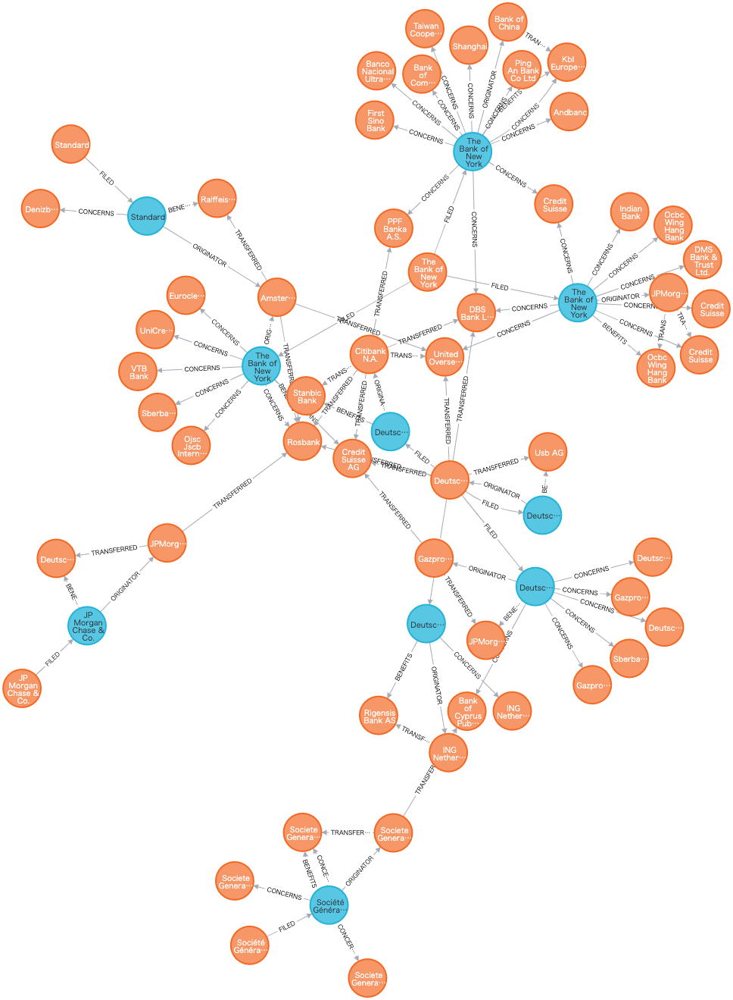

## 関連金額の大きい順

次に一番受け取った金額の大きい順で銀行を見てみます

```
MATCH (e:Entity)-[:BENEFITS]-(f:Filing)
WITH e, round(sum(f.amount)) as total
WITH e, total ORDER BY total DESC LIMIT 10
OPTIONAL MATCH (e)-[:COUNTRY]-(c:Country)
RETURN e.name, c.name, c.code, total
```

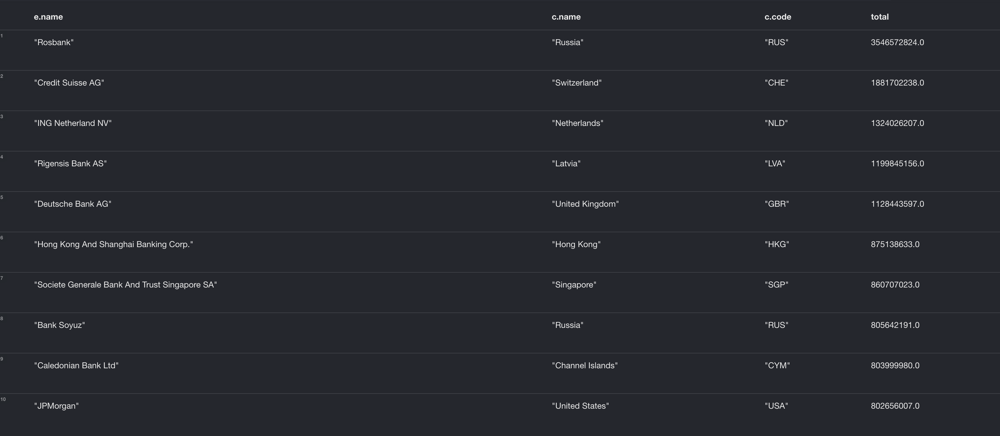

ロシアやスイス、オランダそれから順位が少し下がってイギリス香港シンガポールはなるほど金融やビジネスのプレゼンスだったり雰囲気や評判だったりを考えれば納得感があるけれど、ラボビアは意外ですね。
チャンネル諸島はタックスヘイブンのようです。

送り出した金額の大きい順で見てみます

```
MATCH (e:Entity)-[:ORIGINATOR]-(f:Filing)
WITH e, round(sum(f.amount)) as total
WITH e, total ORDER BY total DESC LIMIT 10
OPTIONAL MATCH (e)-[:COUNTRY]-(c:Country)
RETURN e.name, c.name, c.code, total
```

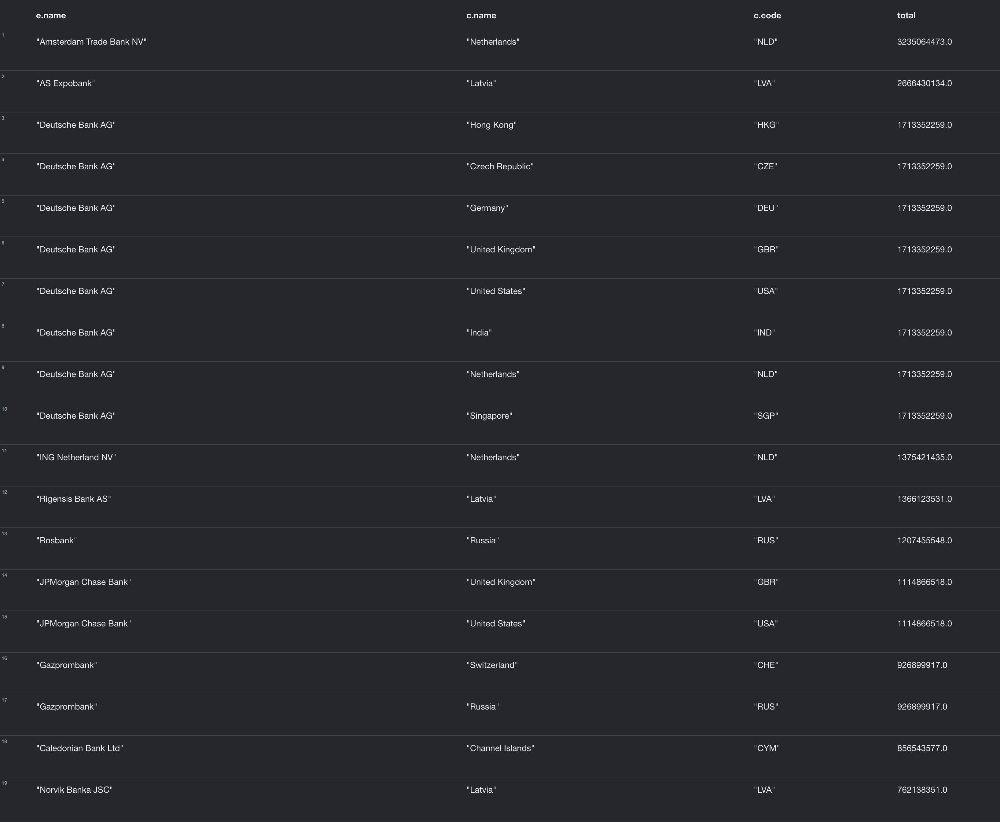

またもやラトビアが上位に来ましたね。
ドイツ銀行の存在感は際立ちます。

## 日本の銀行は？

日本の銀行が上位に現れなかったことは喜ぶべきことかな、しかしニュースなどでは日本の銀行も入っているという話があるので、見てみましょう。

受け取る方
```
MATCH (c:Country {code:'JPN'})--(e:Entity)-[:BENEFITS]-(f:Filing)
WITH e, round(sum(f.amount)) as total
WITH e, total ORDER BY total DESC LIMIT 10
OPTIONAL MATCH (e)-[:COUNTRY]-(c:Country)
RETURN e.name, c.name, c.code, total
```

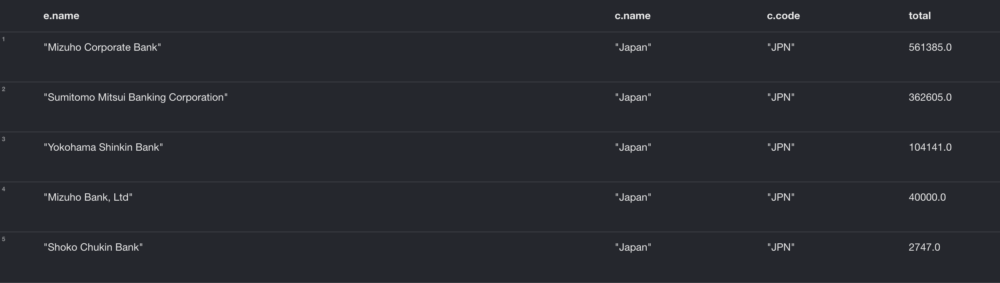

送り出す方
```
MATCH (c:Country {code:'JPN'})--(e:Entity)-[:ORIGINATOR]-(f:Filing)
WITH e, round(sum(f.amount)) as total
WITH e, total ORDER BY total DESC LIMIT 10
OPTIONAL MATCH (e)-[:COUNTRY]-(c:Country)
RETURN e.name, c.name, c.code, total
```

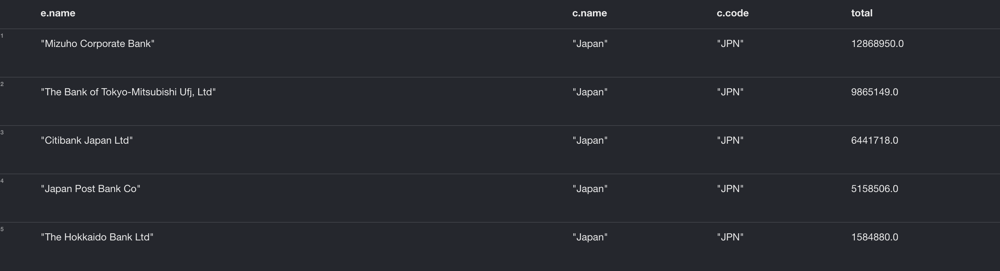

上位と比べればかなり少ない感じがしますね。
このレベルならむしろ褒めてもいいじゃないでしょうか。
確かフィンセン事件で銀行株が下がっていたけれど、これなら買いかも、と思ったりもしますね。
後の祭りですけれど。

また、受け取るよりも送り出すほうがずっと多い印象です。
ダーティマネーは日本をお好きじゃないと見えます。
なんとなくですが、オレオレ詐欺など日本で出たダーティマネーを海外へ逃がすことの方が需要が多そうな気がします。

## 送金ネットワーク

やはり気になるのは銀行間のお金の流れですね。
金額情報がFilingの属性に入っていて、EntityからFilingへ、そしてさらにまたEntityへ辿らないといけませんので、TRANSFERREDリレーションを作っておいたほうが何かと便利です。

次のように作ります。
(Neo4jやCypherクエリの使い方に関してはこちらにチュートリアルがあります。https://neo4j.com/graphacademy/online-training/)

```
MATCH (from:Entity)<-[:ORIGINATOR]-(f:Filing)-[:BENEFITS]->(to:Entity)
WITH from, to, round(sum(f.amount)) as sum
MERGE (from)-[t:TRANSFERRED]->(to) SET t.amount = sum
```

もっとも受け取った金額の大きい３銀行(名付けてトップダーティ３)と送金関係のある銀行のネットワークを見てみます

```
MATCH (e:Entity)-[:BENEFITS]-(f:Filing)
WITH e, round(sum(f.amount)) as total
WITH e, total ORDER BY total DESC LIMIT 3
MATCH (e)-[:TRANSFERRED]-(e2)
RETURN e, e2
```

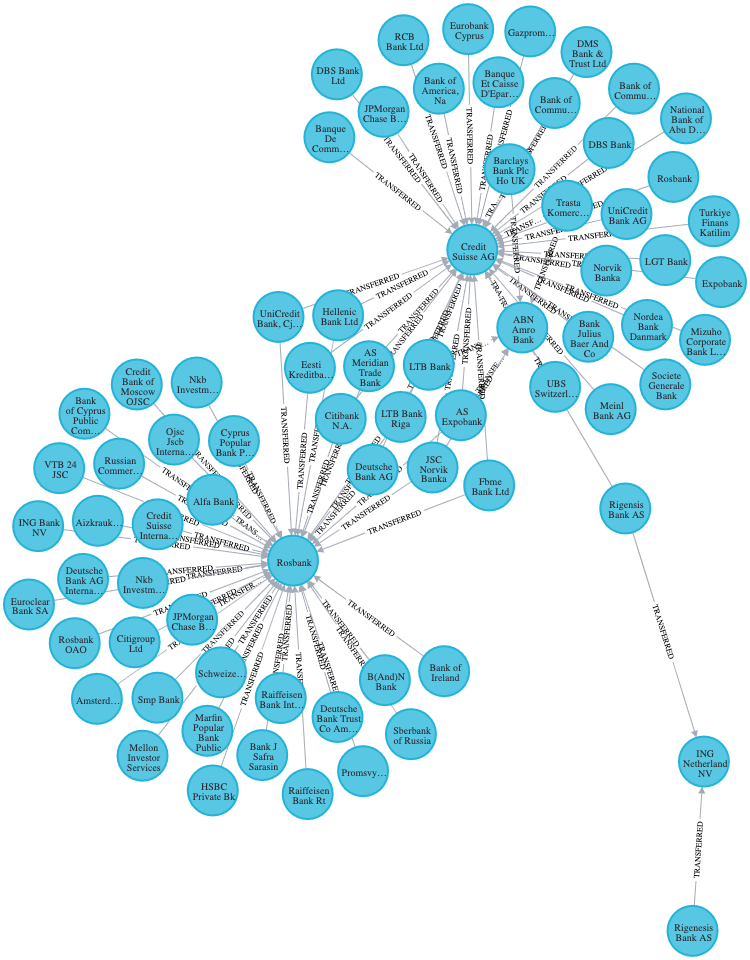

一位のロシアと二位のスイスの銀行は広い裾のを持っている（さすがダーティキング）ことに対して、三位のオランダの銀行は二銀行のみという結果でした。

## ナイーブにグラフアルゴリズム

送金ネットワークに対してグラフアルゴリズムを適応しやすくなります。

### pagerank

まずはPageRankをやってみます。
ナイーブにはお金の流れ着く先という意味合いがあります。
例えば報告書にある送金がマネロンダリングの送金の一部でしかないと仮定して、ダーティマネーが流れ入ってから一定の割合で流れ出るとすれば、PageRankはダーティマネーの貯まり具合と解釈することができます。

```
CALL gds.pageRank.write({
  nodeProjection: 'Entity',
  relationshipProjection: {
    relType: {type: 'TRANSFERRED', orientation: 'NATURAL',
      properties: { amount: { property: 'amount', defaultValue: 1 }}
    }
  },
  relationshipWeightProperty: 'amount',
  writeProperty: 'pagerank'
});
```

PageRankトップ3とその周りに送金関係を見てみます

```
MATCH (e:Entity) 
WITH e ORDER BY e.pagerank DESC LIMIT 3
MATCH (e)-[:TRANSFERRED]-(e2:Entity)
RETURN e, e2
```

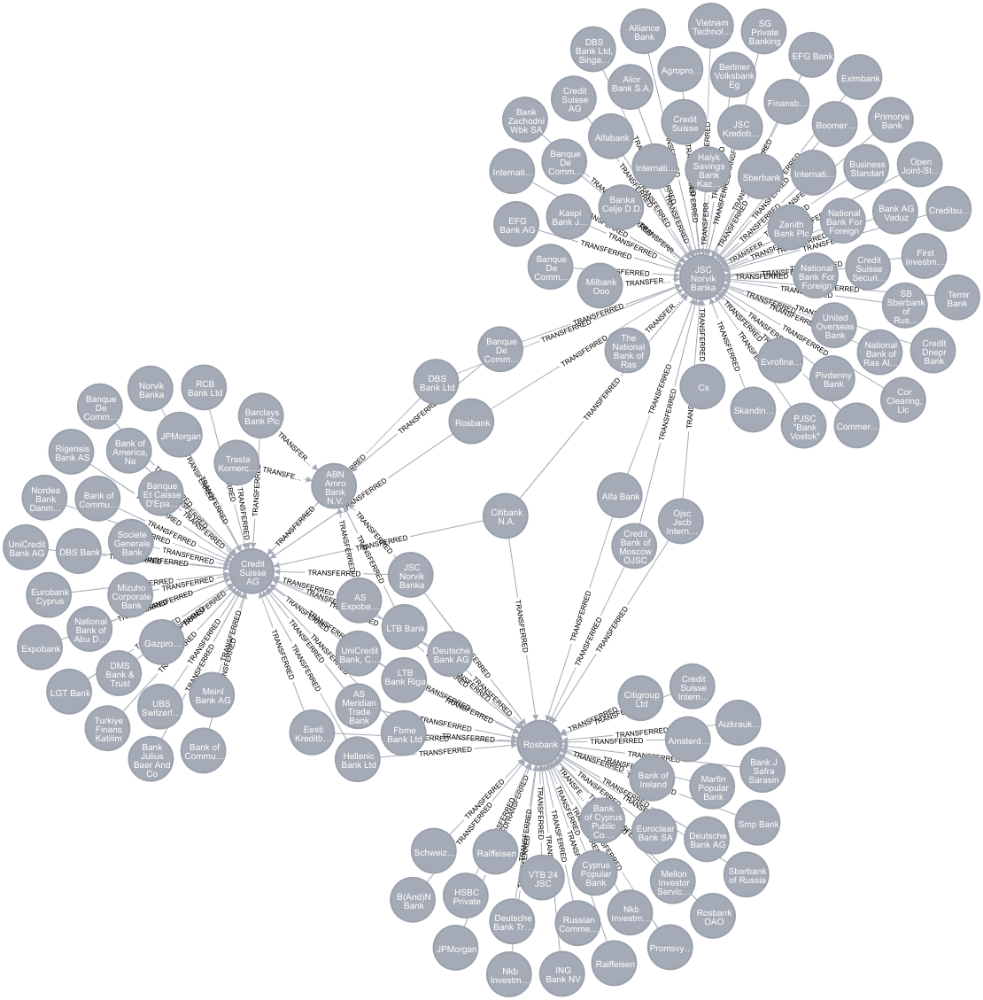

なんとなくクラスタを形成しているようにも見えます

### louvain

louvainアルゴリズムでクラスタリングを行います

```
CALL gds.louvain.write({
  nodeProjection: 'Entity',
  relationshipProjection: {
    relType: {type: 'TRANSFERRED', orientation: 'NATURAL',
      properties: { amount: { property: 'amount', defaultValue: 1 }}
    }
  },
  relationshipWeightProperty: 'amount',
  includeIntermediateCommunities: false,
  writeProperty: 'cluster'
});
```

Neo4j BloomからPagerankに応じてノードの大きさを、送金量に応じてリンクの太さを、トップ３のノードが属しているクラスターをそれぞれ色分けて表示させると次のようになります。

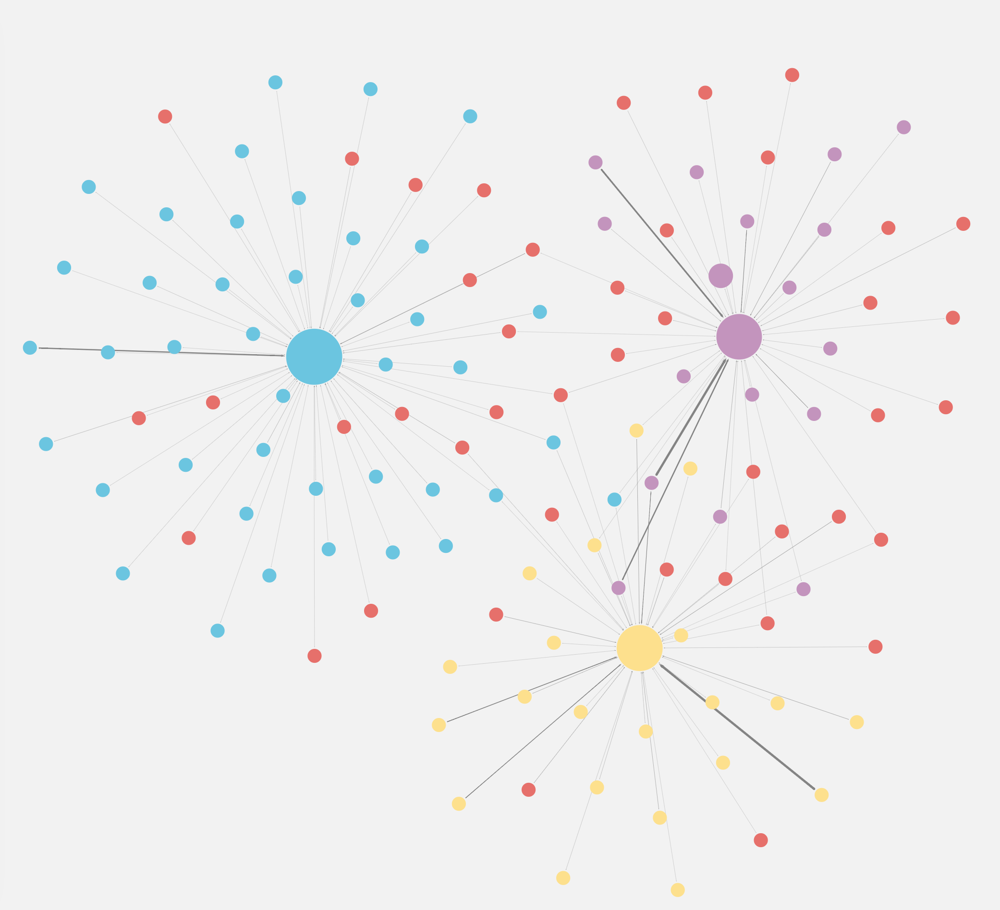

最も大きいノード（青ノード）の周りに点が最も多くて、幅広い金融機関から疑わしい送金を受け取ったことがPagerankに寄与したと思われます。
（例えばこちらでhttps://qiita.com/s_zh/items/1b193758965a491e79bc 政治家のTwitterアカウントの場合だとPagerankが高いノードにフォローされることが影響が大きかったことと対照的です）

## もうすこしアルゴリズムについて

ここでは簡単に送金ネットに対してナイーブにアルゴリズムを適応しましたが、更に先へ進むにはいろいろ考えるポイントがあります。

- 送金ネットが連結グラフではなく、不連続な部分に分かれています
- このタイプの送金額は通常べき分布に従うことが多く、そのまま重みに使うと大きな金額がだけが重視される可能性がある
- 受け取る方の重要性だけじゃなくて送り出す方の重要性も調べたい
- つながりの状況を反映した特徴量を見つけたい
- ...

Cypher Queryこの記事ではCypher Queryだけでやっていましたが、Pythonとの組み合わせれば手軽にもっと柔軟性の高い解析ができるようになります。

## Graph Apps

Neo4j Desktopをインストールしてある場合、サードパーティ製のアプリ(Graph Apps)を追加でインストールできます。
例えばNeomapを使うと、次のように地図と関連付けてデータを表示することもできます(地域別に送金先となった件数)。

- Neomap: https://github.com/stellasia/neomap

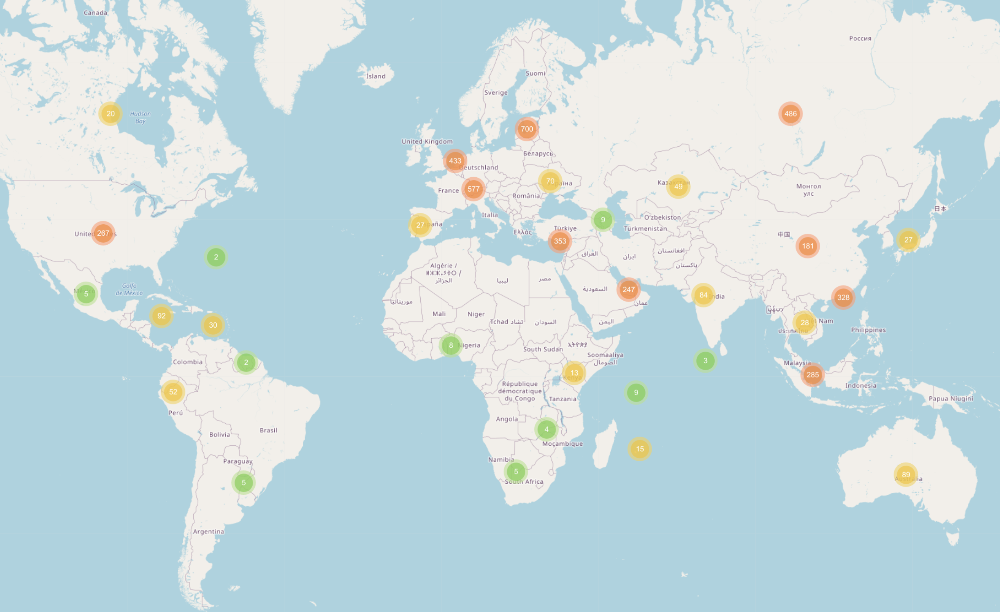

これだけをみると日本が大きな経済規模であるにもかかわらずそれなりにクリーンだったことが言えるかもしれません。
シンガポールと香港は金融センターであると同時にダーティセンターという一面もあるようです。

ヨーロッパを拡大すると次のようになります。

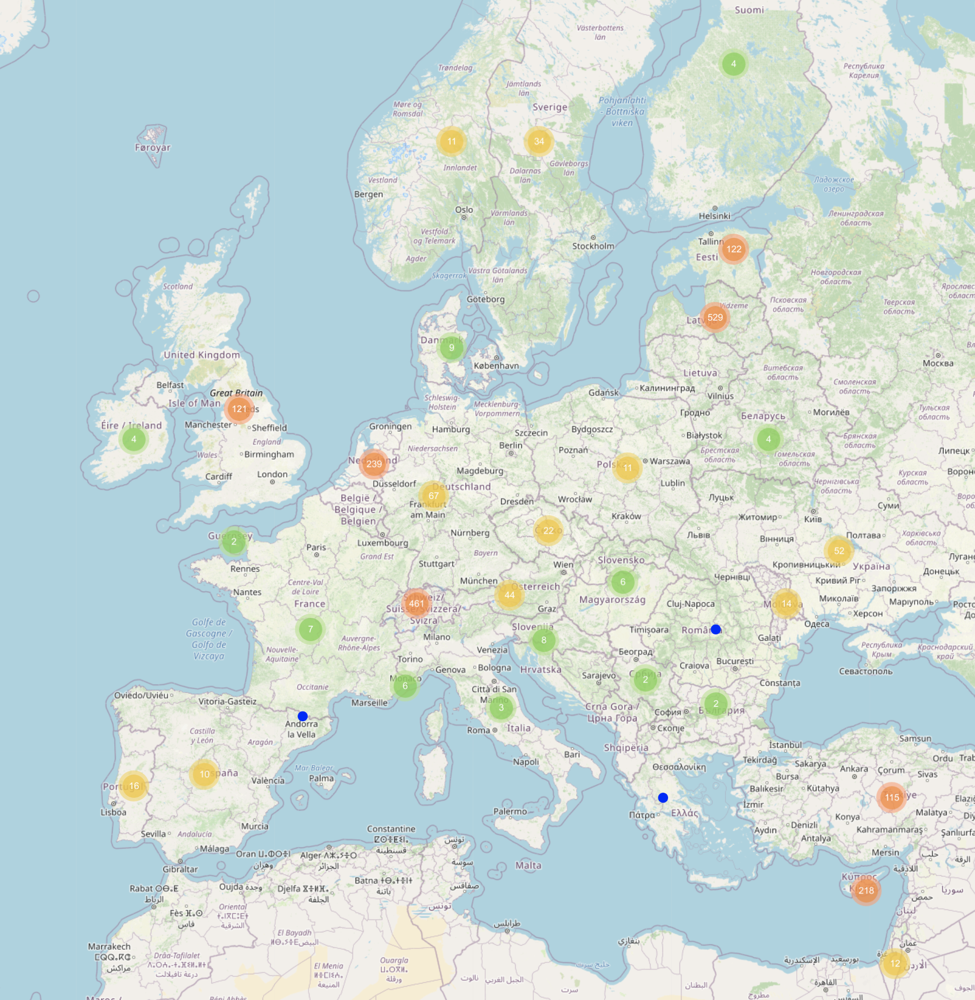

フランスグリーンが目立ちます。
スイス・オランダのツートップとそれを追うイングランドあたりは「まぁそんなもんかな」という感もしますが、隠れたる中心のラトビアが意外でした。
ラトビアの北に位置するIT先進国として有名なエストニア、あっちの方も侮れない感じです。